In [1]:
import os

import tifffile as tff
from skimage.filters import threshold_otsu, threshold_local
from skimage.feature import peak_local_max
from skimage.segmentation import watershed
import skimage.measure as measure
import cv2
import scipy as sp

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gs
import seaborn as sns

In [2]:
def to8bit(img):
    amax = np.amax(img)
    if amax  > 255:
        img = cv2.convertScaleAbs(img, alpha = (255.0/amax))
    else:
        img = cv2.convertScaleAbs(img)
    return img
   
def clean_background(img, kernel=np.ones((3,3),np.uint8)):
    img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel, iterations = 3)
    img_cleaned = img.copy()
    plot(img_cleaned, 'cleaned')

def mark(img, kernel=np.ones((3,3),np.uint8)):
    img_eroded = cv2.erode(img, kernel, iterations=2)
    distance = sp.ndimage.distance_transform_edt(img_cleaned)
    distance[img_eroded==0] = 0 # ????????
    local_maxi = peak_local_max(distance, indices=False, footprint=np.ones((5, 5)))
    markers = measure.label(local_maxi)
    
def plot(img, title):
    plt.title(title)
    plt.imshow(img, cmap='gray', interpolation='bicubic')
    plt.tight_layout()
    plt.show()
    
def plot_s(img, title, row_grid, col):
    plt.subplot(row_grid[col])
    plt.title(title)
    plt.imshow(img, cmap='gray', interpolation='bicubic')

def segment(filename, acq):
    # http://www.scipy-lectures.org/packages/scikit-image/
    # http://www.scipy-lectures.org/advanced/image_processing/
    
    plt.figure(figsize=(3,3))
    row_grid = gs.GridSpec(1, 1, top=2.5, bottom=0., right=2.5, left=0., hspace=0., wspace=.2)

    # INPUT (summed immages)
    im = acq.mean(axis=0)
    im_original = im.copy()
#     plot_s(im_original, 'raw', row_grid, 0)

    # CONVERT (to 8-bit)
    im = to8bit(im)

    # THRESHOLD (auto)
    thresh = threshold_otsu(im)
    im[im<thresh] = 0
    im[im>=thresh] = 255
    im_thresh = im.copy()
#     plot_s(im_thresh, 'thresh', row_grid, 1)

    # CLEAN BACKGROUND (opening)
    kernel = np.ones((3,3),np.uint8)
    im = cv2.morphologyEx(im, cv2.MORPH_OPEN, kernel, iterations = 3) # was 3
    im_cleaned = im.copy()
#     plot_s(im_cleaned, 'cleaned', row_grid, 2)

    # MARK BEADS
    kernel = np.ones((3,3),np.uint8)
    im_eroded = cv2.erode(im, kernel, iterations=2)
    distance = sp.ndimage.distance_transform_edt(im_cleaned)
    distance[im_eroded==0] = 0 # ????????
    local_maxi = peak_local_max(distance, indices=False, footprint=np.ones((5, 5)))
    markers = measure.label(local_maxi)

    # SEGMENT
    connectivity = 20
    compactness = 0.0
    label_img = watershed(-distance, markers, connectivity, compactness=compactness, mask=im_cleaned)
    labels_masked = np.ma.masked_where(label_img==0, label_img)

    plt.subplot(row_grid[0])
    plt.title('segmented')
    plt.imshow(im_original, cmap='gray', vmin=0)
    plt.imshow(labels_masked, cmap='prism', alpha=.35)
    
    # BUILD DATAFRAME
    df = pd.DataFrame(columns=['well', 'ln', 'i_img', 'i_bead', 'x','y','n_px'])
       
    labels_v, counts = np.unique(label_img, return_counts=True)

    for i, chan in enumerate(acq):
        df['med{}'.format(i)] = sp.ndimage.labeled_comprehension(chan, label_img, labels_v, np.median, float, -1)
    
    regionprops = measure.regionprops(label_img, label_img)
    df['x'] = [-1]+[region.centroid[0] for region in regionprops]
    df['y'] = [-1]+[region.centroid[1] for region in regionprops]
    
    df['well'] = int(filename[0])
    filename = filename[1:]
    filename = filename.split('_')
    df['ln'] = filename[0]
    df['i_img'] = int(filename[1])
    df['i_bead'] = labels_v
    df['n_px'] = counts
    
    # boundary circle
    c = plt.Circle((1024/2, 1024/2), 368, color='white', linewidth=1, fill=False)
    plt.gca().add_patch(c)
    
    print('n_beads: {}'.format(len(df)-1))
    plt.show(row_grid)
    
    return df

# Load Image Array

0-index, +bf:
- 5: dy
- 6: eu
- 8: sm

### Raw

In [3]:
folder = 'stacked'
# input dimensions
c = 10
n = 38
x = 1024
y = 1024

folders = os.listdir(folder)  # each folder: one acquisition w/ multiple channels
folders = [f for f in folders if f[0].isdigit()]  # filter
folders.sort()
n_names = folders
img_arr = np.zeros((n,c,x,y), dtype='uint16')
for n_i, f in enumerate(folders):
    full_path = os.path.join(folder, f)
    img_arr[n_i] = tff.imread('{}/{}_MMStack_Pos0.ome.tif'.format(full_path,n_names[n_i]))

print('(n, c, x, y)')
print(img_arr.shape)

(n, c, x, y)
(38, 10, 1024, 1024)


# Show Image Array

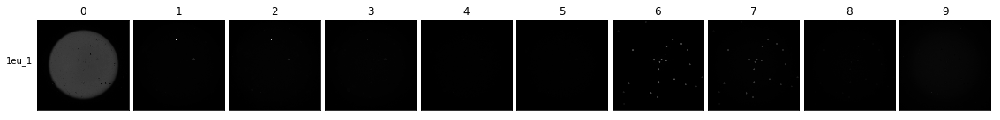

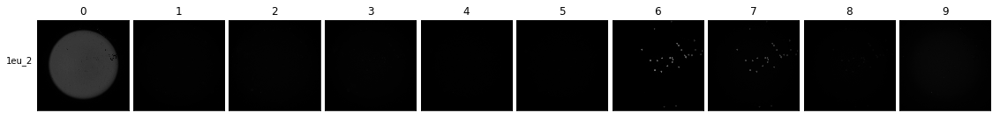

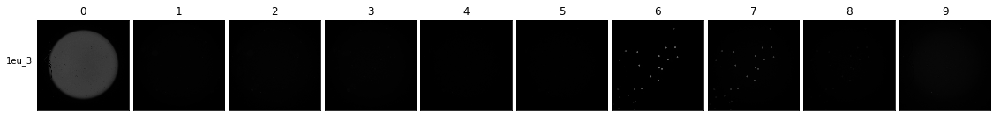

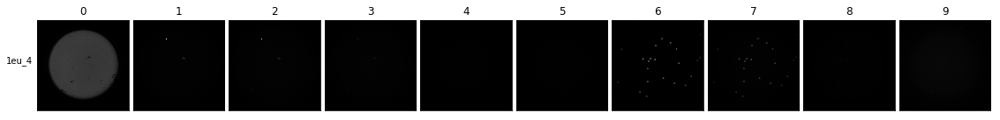

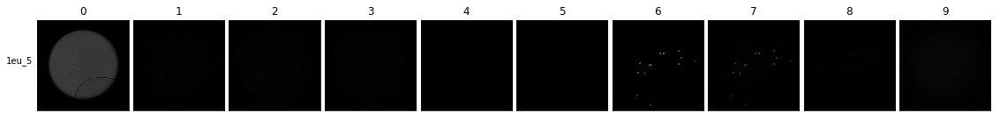

...

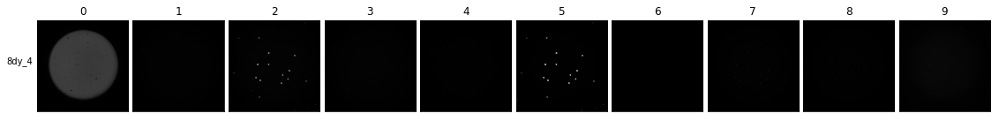

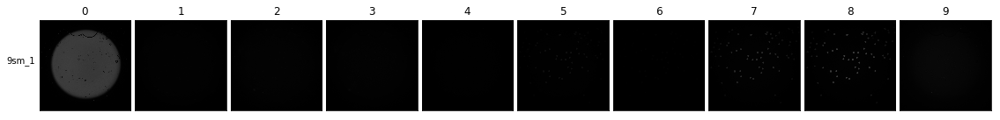

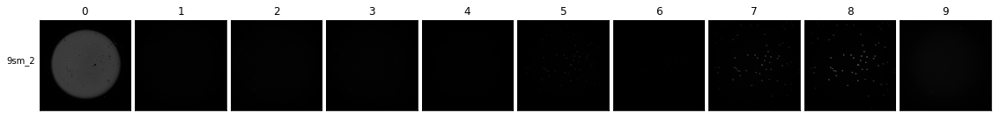

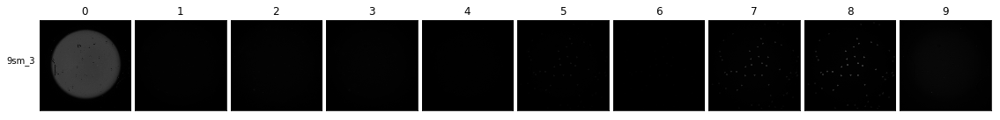

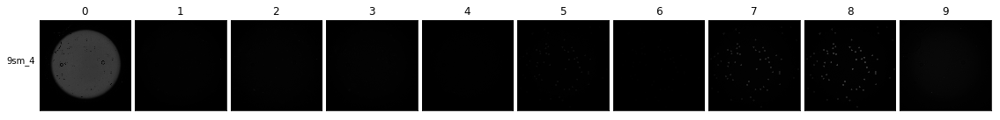

In [4]:
# acquisition iterator (row)
for name,acq in zip(n_names, img_arr):
    row_grid = gs.GridSpec(1, c, top=2.5, bottom=0., right=2.5, left=0., hspace=0., wspace=.05)
    
    # channel iterator (col)
    for j, (ch, col) in enumerate(zip(acq, row_grid)):
        ax = plt.subplot(col)
        ax.imshow(ch[:,:], cmap='gray',vmin=0, vmax=2**16-1)
        ax.set_yticks([])
        ax.set_xticks([])
        if j==0:
            ax.set_ylabel(name, labelpad=5, rotation='horizontal', horizontalalignment='right')
        plt.title(j)
    plt.show()

# Segment

1eu_1 ------------------------------------------------------
n_beads: 18


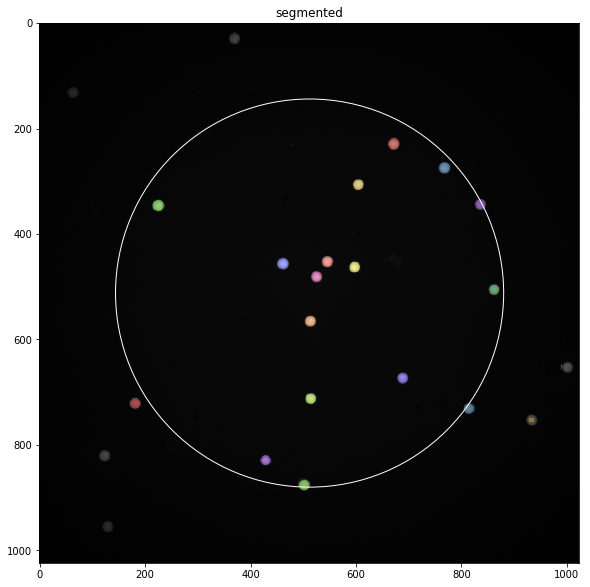

1eu_2 ------------------------------------------------------
n_beads: 21


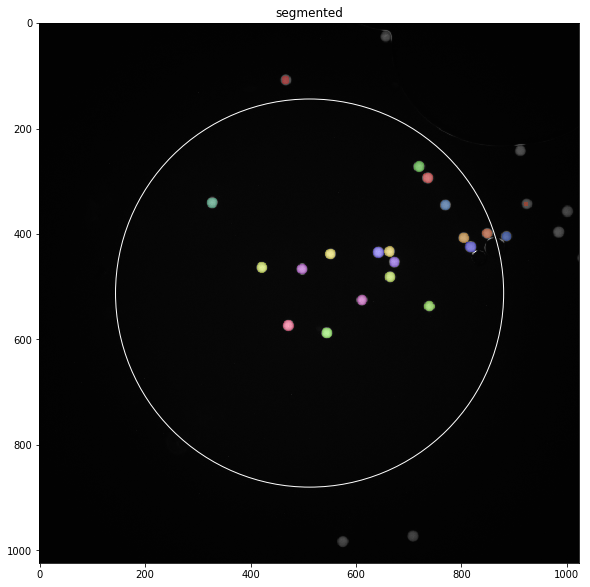

1eu_3 ------------------------------------------------------
n_beads: 16


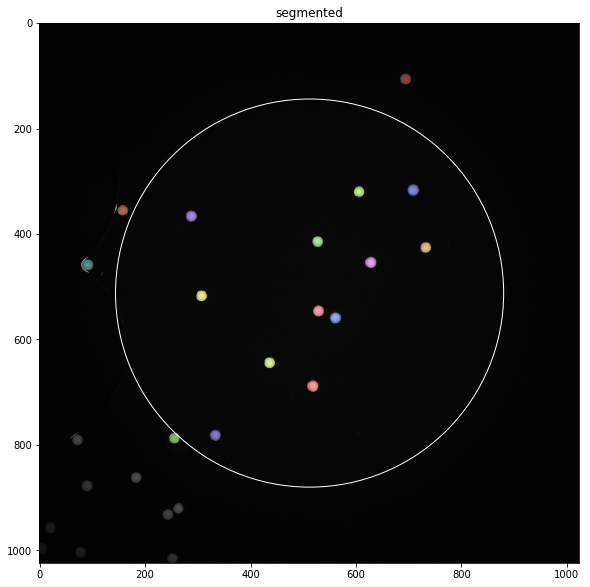

1eu_4 ------------------------------------------------------
n_beads: 20


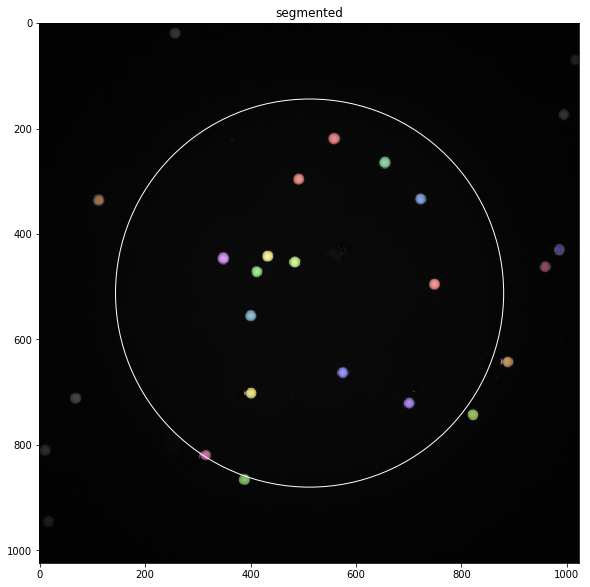

1eu_5 ------------------------------------------------------
n_beads: 13


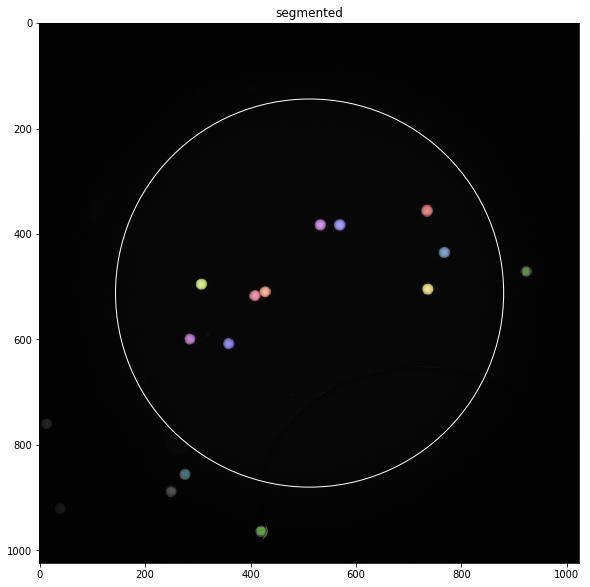

2dy_1 ------------------------------------------------------
n_beads: 36


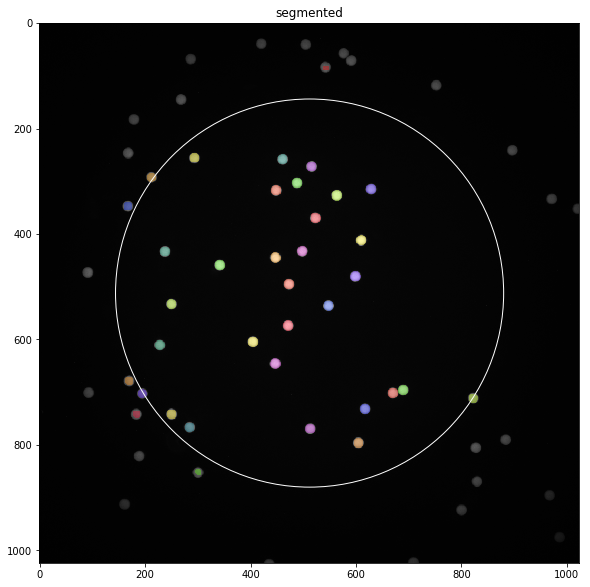

2dy_2 ------------------------------------------------------
n_beads: 35


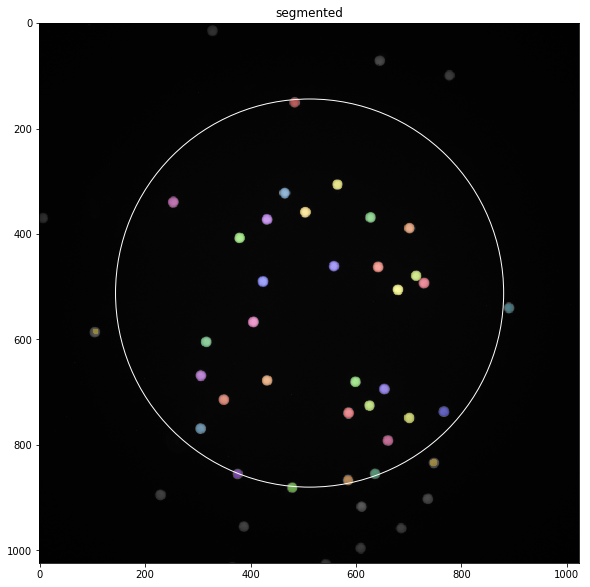

2dy_3 ------------------------------------------------------
n_beads: 48


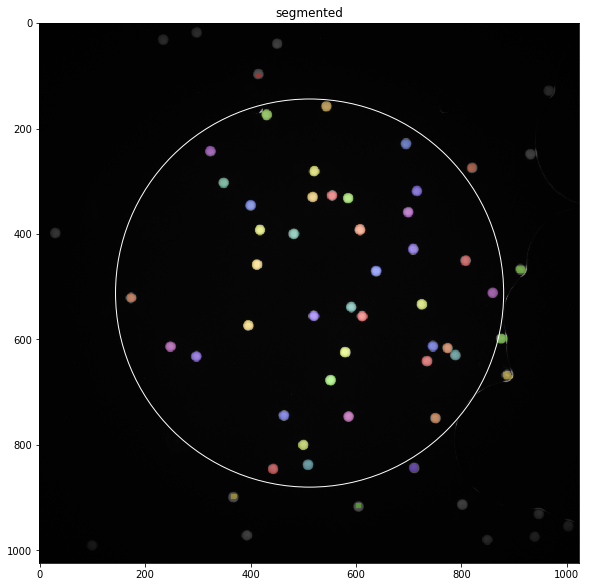

2dy_4 ------------------------------------------------------
n_beads: 28


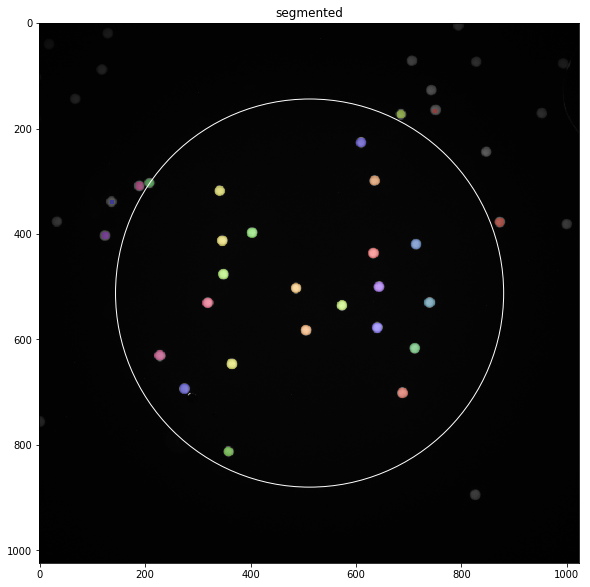

3sm_1 ------------------------------------------------------
n_beads: 19


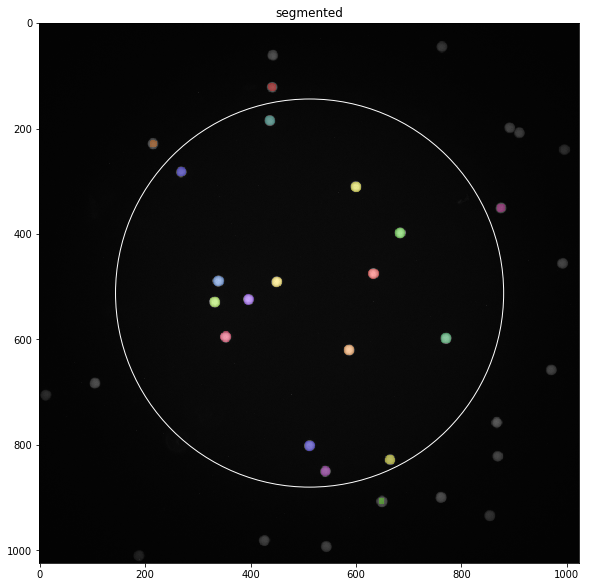

3sm_2 ------------------------------------------------------
n_beads: 23


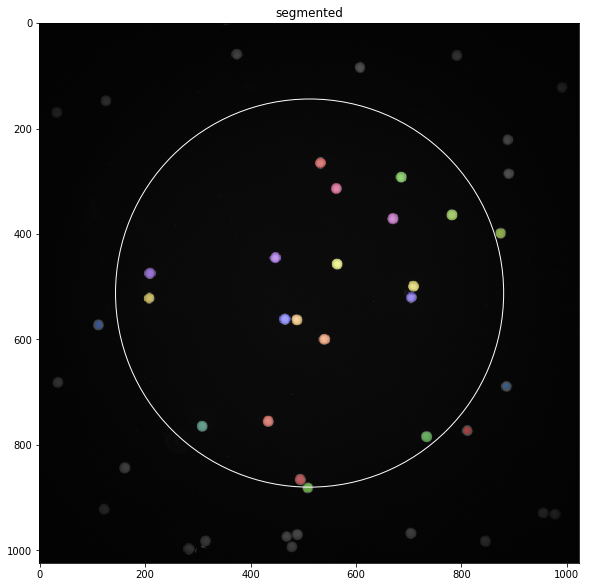

3sm_3 ------------------------------------------------------
n_beads: 22


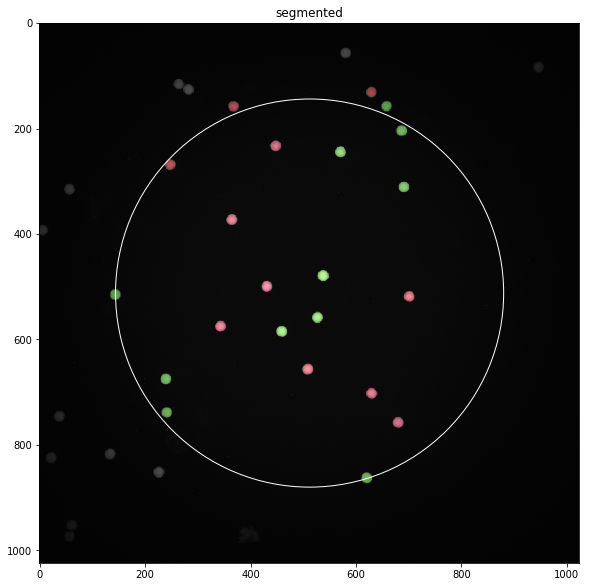

3sm_4 ------------------------------------------------------
n_beads: 25


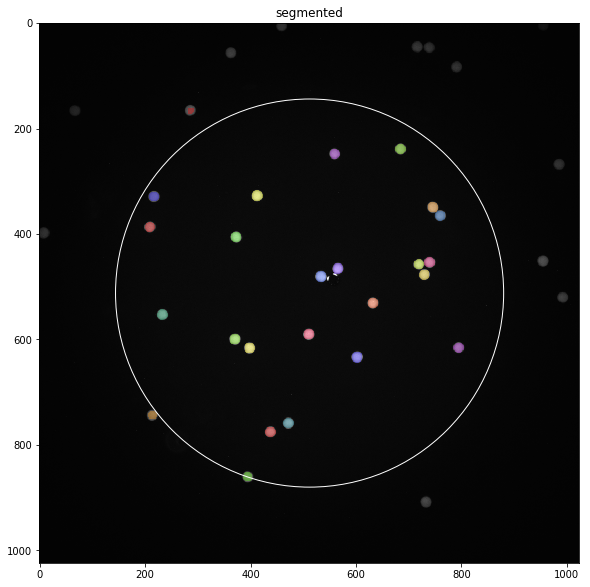

4eu_1 ------------------------------------------------------
n_beads: 21


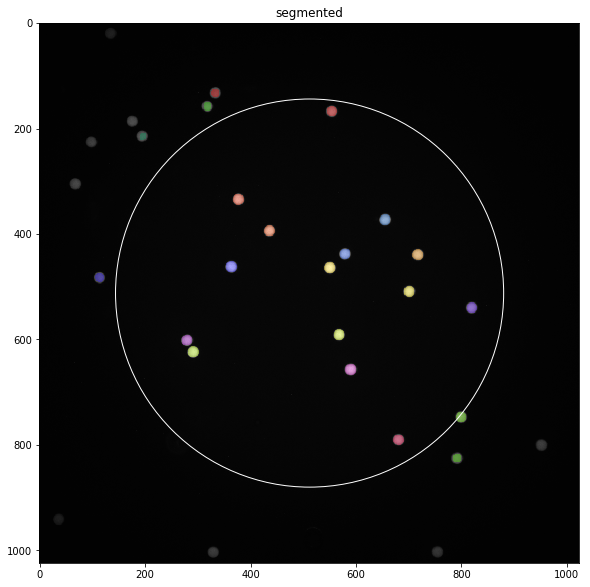

4eu_2 ------------------------------------------------------
n_beads: 17


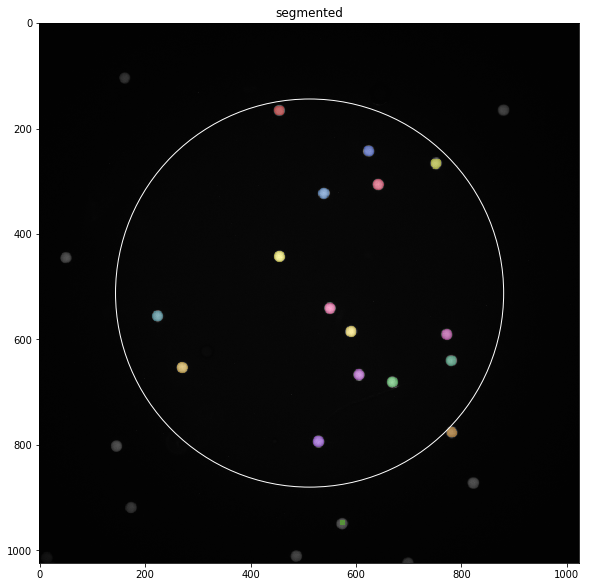

4eu_3 ------------------------------------------------------
n_beads: 10


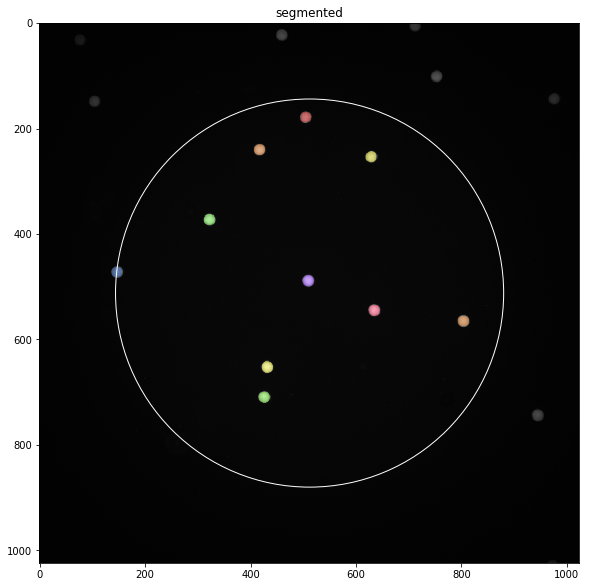

4eu_4 ------------------------------------------------------
n_beads: 5


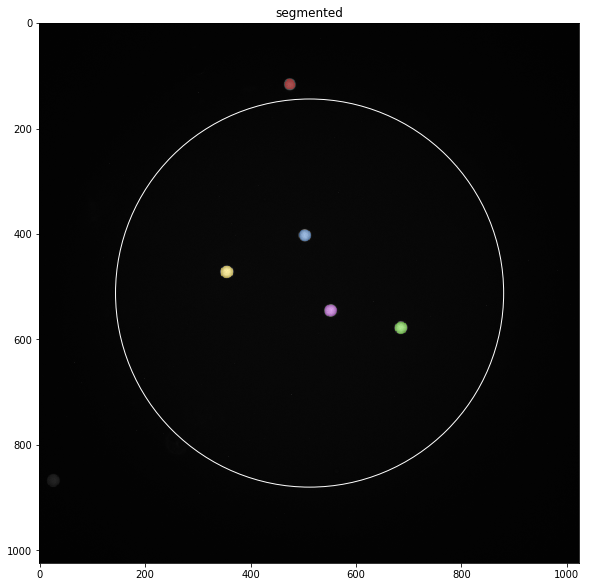

5dy_1 ------------------------------------------------------
n_beads: 15


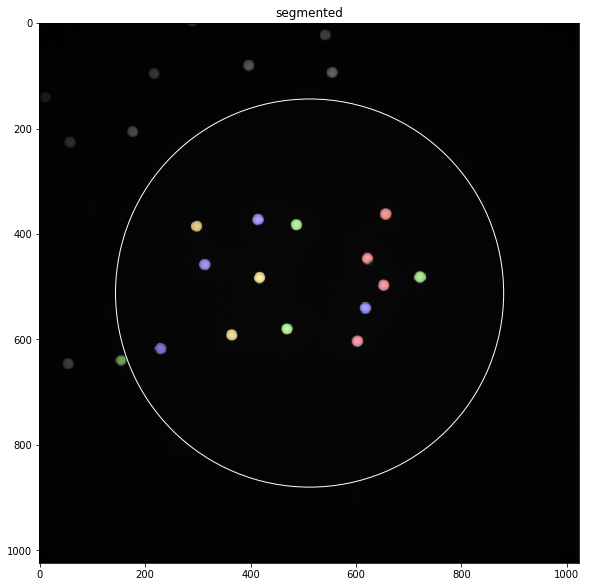

5dy_2 ------------------------------------------------------
n_beads: 44


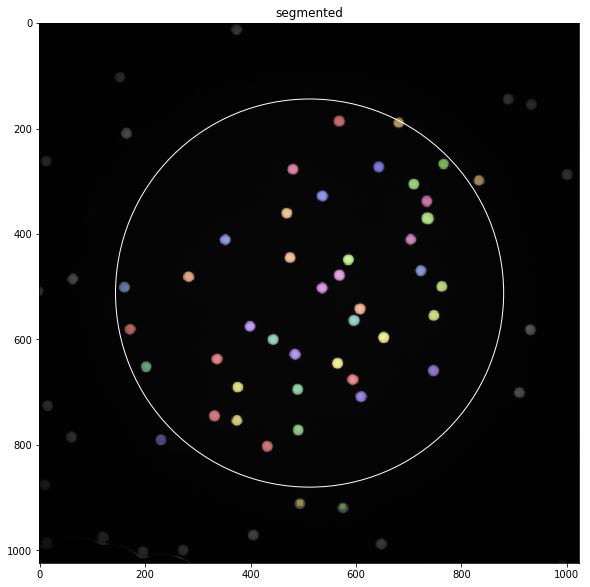

5dy_3 ------------------------------------------------------
n_beads: 44


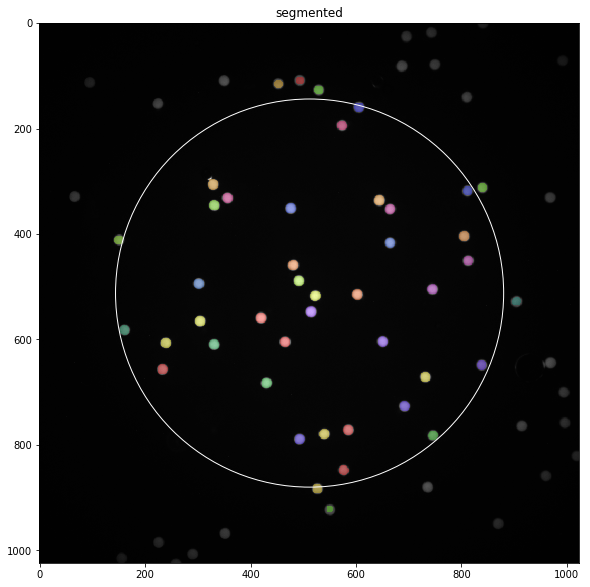

5dy_4 ------------------------------------------------------
n_beads: 45


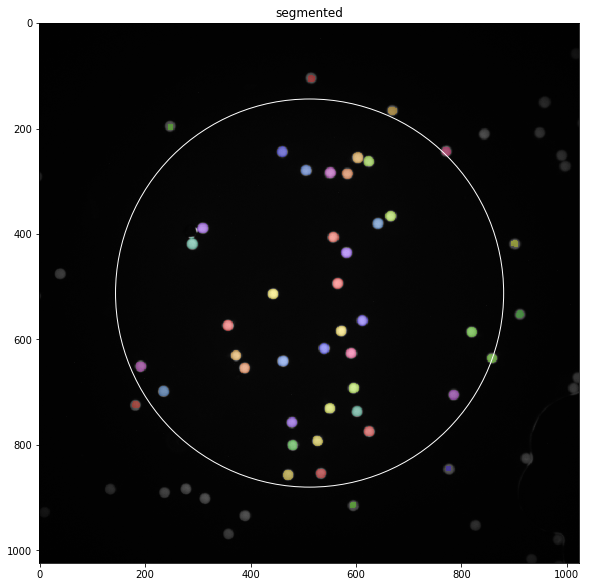

6sm_1 ------------------------------------------------------
n_beads: 76


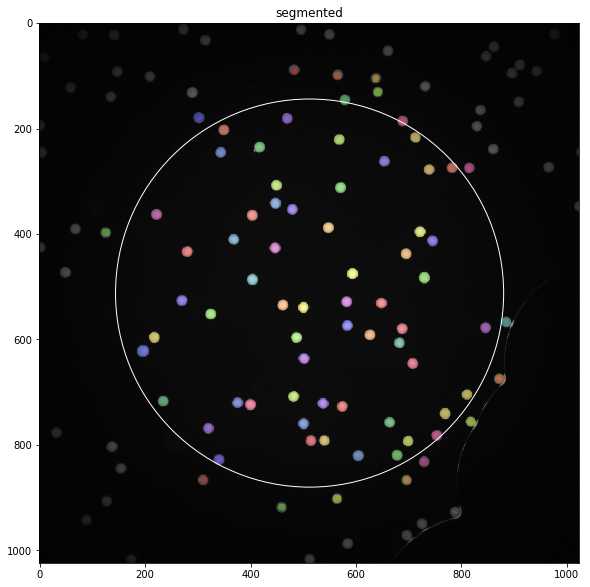

6sm_2 ------------------------------------------------------
n_beads: 47


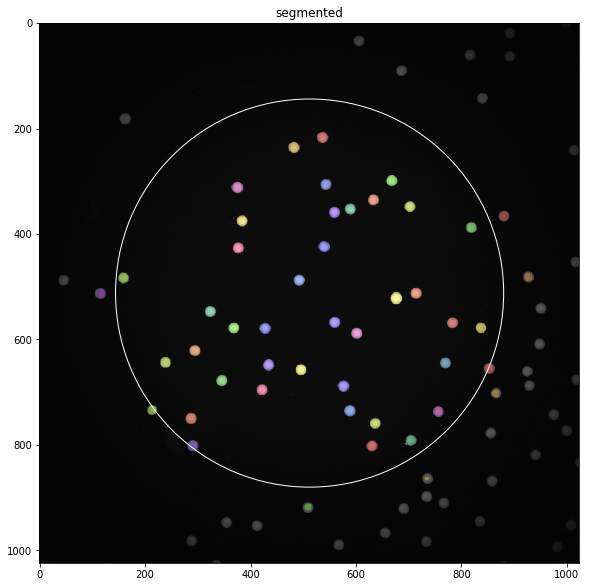

6sm_3 ------------------------------------------------------
n_beads: 35


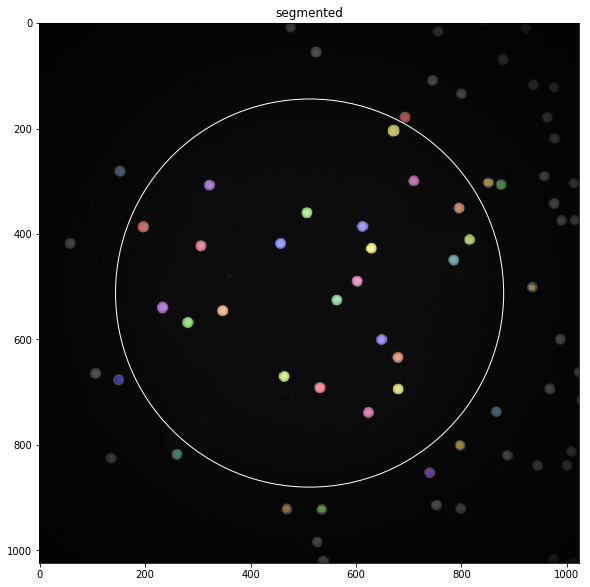

6sm_4 ------------------------------------------------------
n_beads: 38


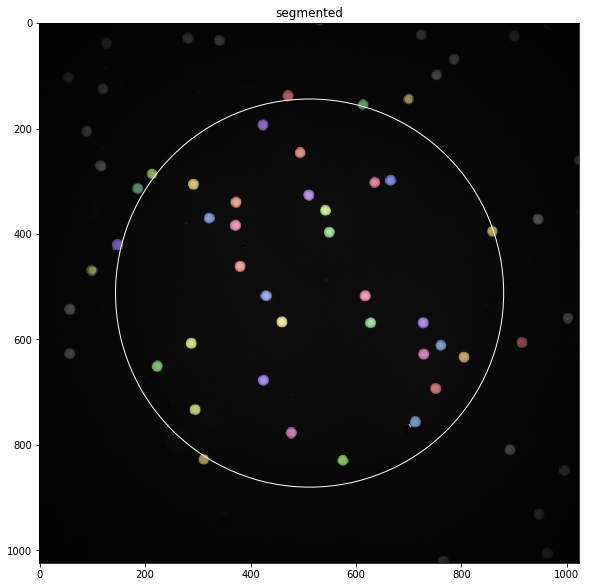

7eu_1 ------------------------------------------------------
n_beads: 22


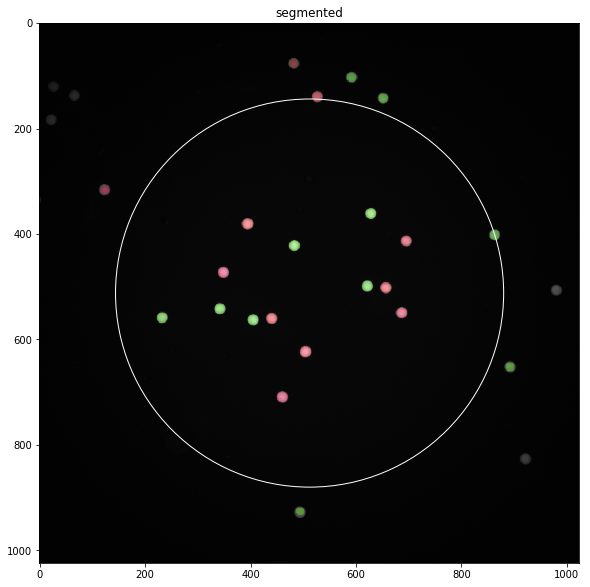

7eu_2 ------------------------------------------------------
n_beads: 30


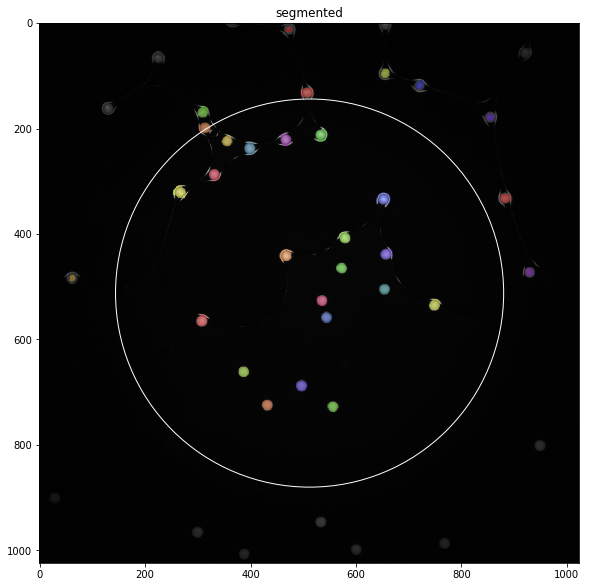

7eu_3 ------------------------------------------------------
n_beads: 18


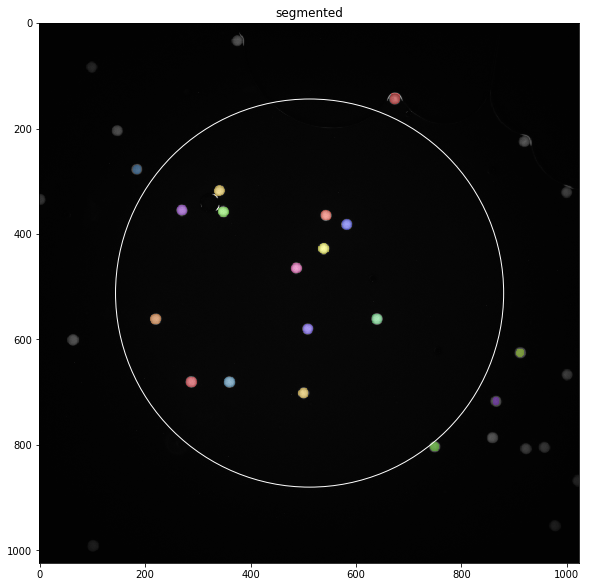

7eu_4 ------------------------------------------------------
n_beads: 44


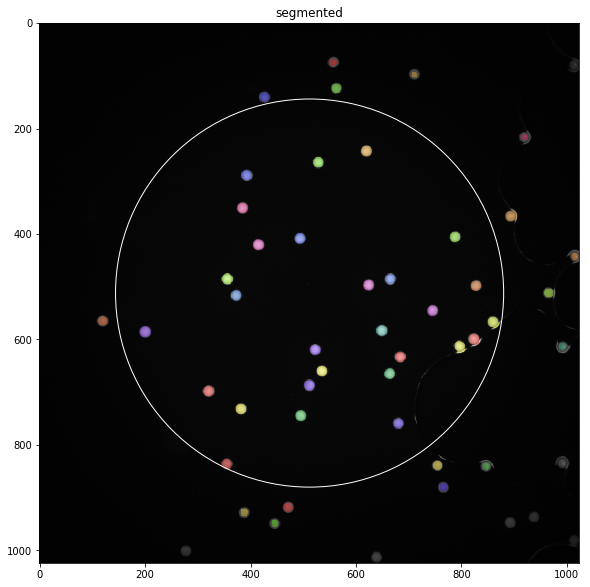

7eu_5 ------------------------------------------------------
n_beads: 23


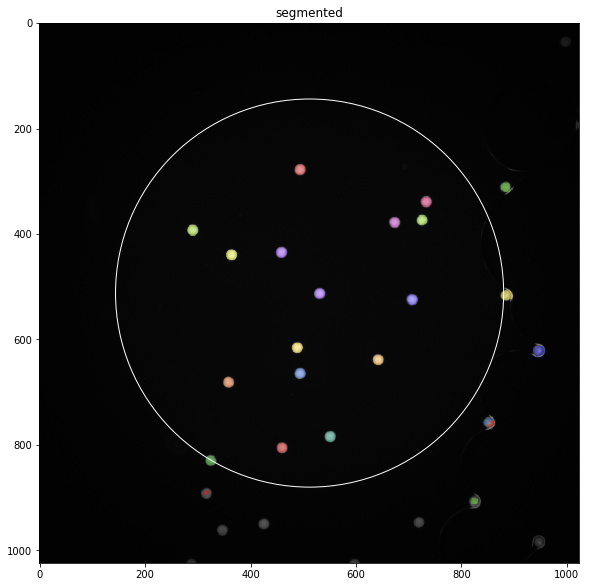

8dy_1 ------------------------------------------------------
n_beads: 32


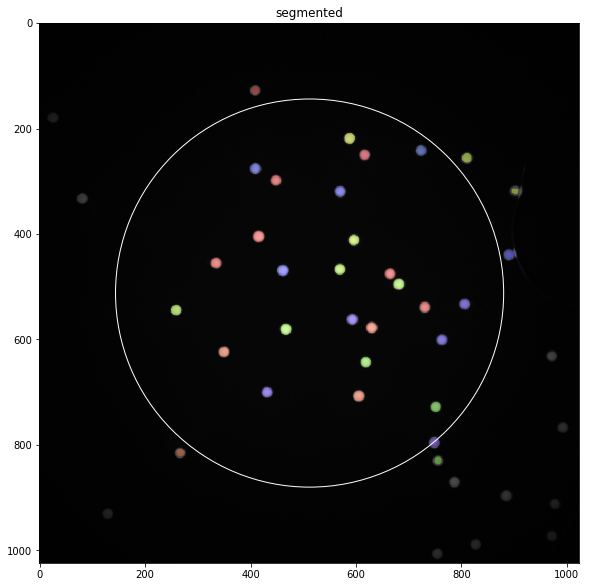

8dy_2 ------------------------------------------------------
n_beads: 50


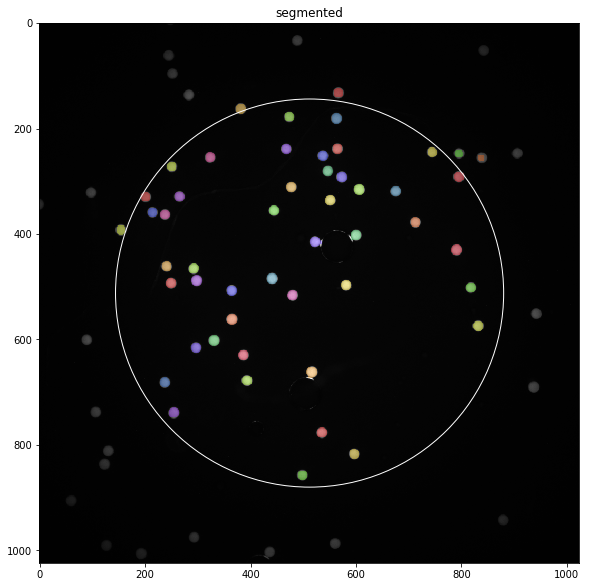

8dy_3 ------------------------------------------------------
n_beads: 12


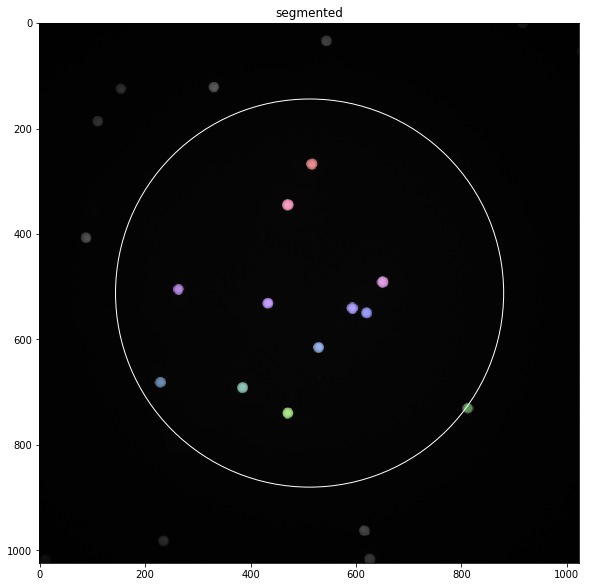

8dy_4 ------------------------------------------------------
n_beads: 13


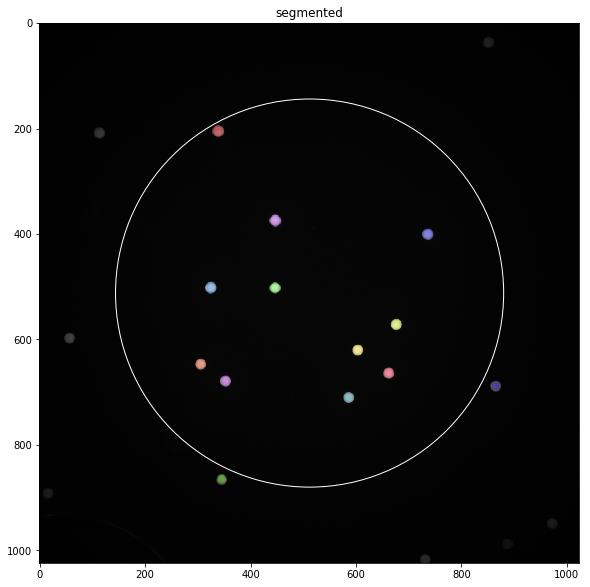

9sm_1 ------------------------------------------------------
n_beads: 48


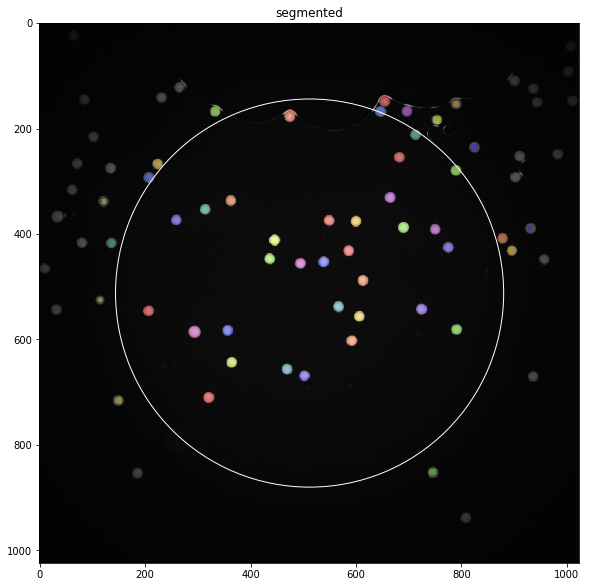

9sm_2 ------------------------------------------------------
n_beads: 40


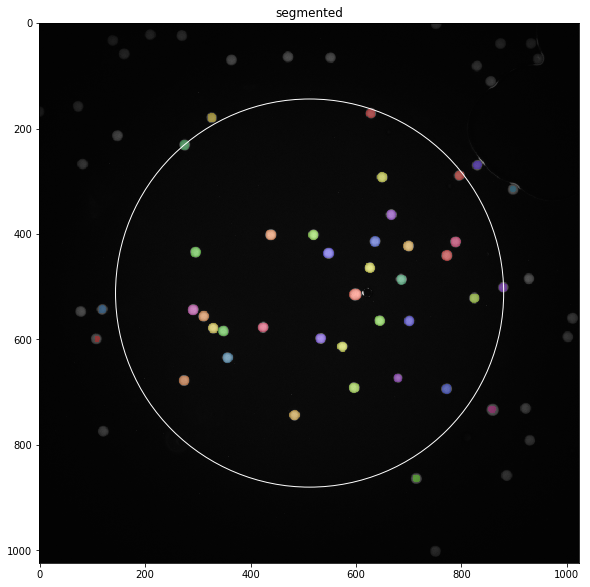

9sm_3 ------------------------------------------------------
n_beads: 33


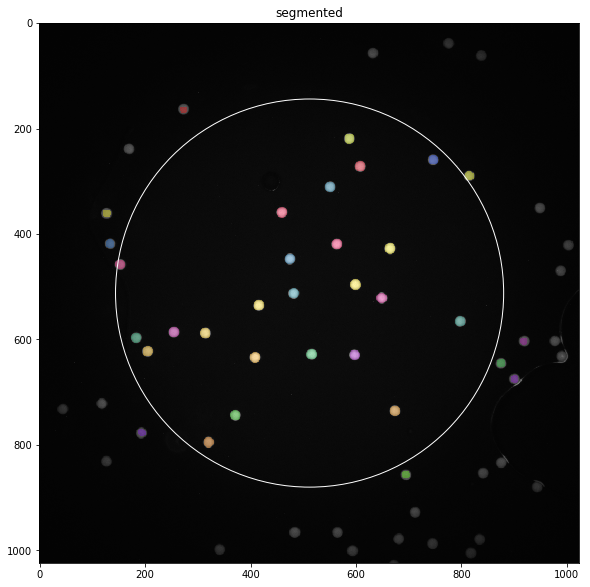

9sm_4 ------------------------------------------------------
n_beads: 49


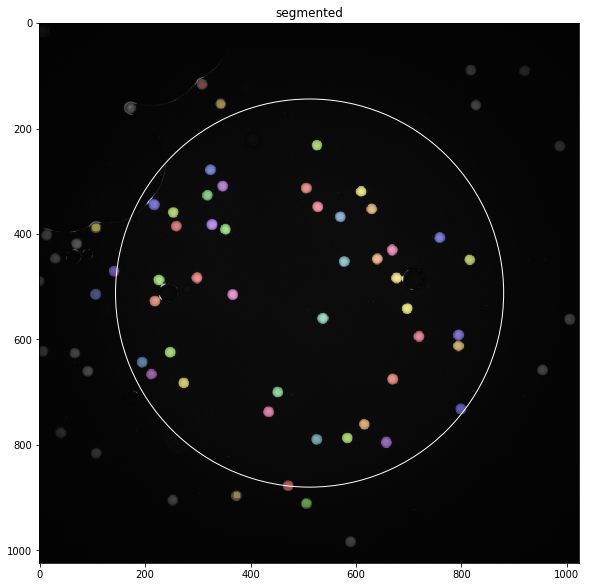

In [5]:
df = pd.DataFrame()
for n_i in range(n):
    print(n_names[n_i], '------------------------------------------------------')
    df = df.append(segment(n_names[n_i], img_arr[n_i,[5,6,8]]))
    df.reset_index(drop=True, inplace=True)

In [6]:
beads = df[df.i_bead>0].copy()

# ADJUST/ADD COLUMNS --------------------------
beads['x'] = beads.x - img_arr.shape[-1]/2.
beads['y'] = beads.y - img_arr.shape[-2]/2.
beads['r'] = (beads.x**2 + beads.y**2)**.5
beads['r_px'] = (beads.n_px/np.pi)**.5

print(len(beads))
beads.well.value_counts()

1135


6    196
9    170
5    148
2    147
7    137
8    107
3     89
1     88
4     53
Name: well, dtype: int64

In [7]:
# FILTER ----------------------------------------------
beads = beads[beads.r<368]   
print(len(beads))
# beads = beads[225<beads.n_px]
# print(len(beads))
# beads = beads[395>beads.n_px]
# print(len(beads))
beads.well.value_counts()

894


6    150
9    129
5    126
2    119
8     92
7     90
3     75
1     69
4     44
Name: well, dtype: int64

## Flat Field

In [8]:
# https://github.com/plotly/plotly.py#installation
import plotly.graph_objs as go
from plotly.graph_objs import Scatter3d, Surface
from plotly.graph_objs.scatter3d import Marker
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

from scipy.optimize import curve_fit, fmin, fsolve

[-1.18200125e-01 -1.22457314e-01 -3.25046830e-03 -6.42596507e-01
 -1.98344668e-01  3.93388148e+04]
a/b: 0.965
c: -0.0033
d,e: -0.64 -0.2
f: 39338.8148

[-2.70763616 -0.77388294]


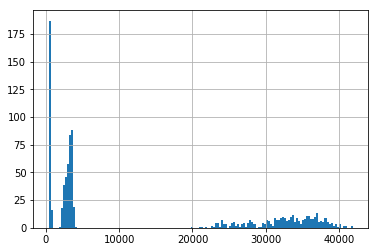

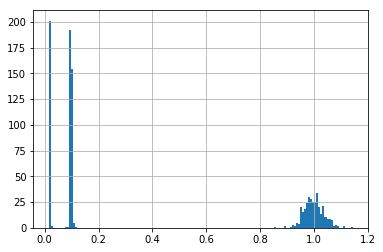

[-4.97973825e-02 -4.98188721e-02  2.23754303e-02 -2.32926540e+00
 -3.56870318e-01  2.46175701e+04]
a/b: 1.0
c: 0.0224
d,e: -2.33 -0.36
f: 24617.5701

[-25.47751383  -9.30313635]


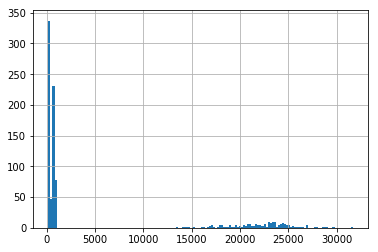

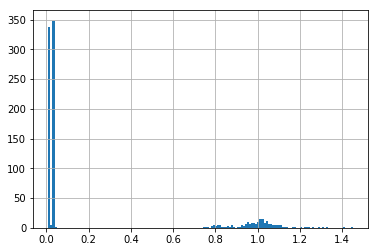

[-4.31557215e-02 -4.33984674e-02  1.66570961e-03 -3.37841544e-01
 -3.89551707e-01  1.48088925e+04]
a/b: 0.994
c: 0.0017
d,e: -0.34 -0.39
f: 14808.8925

[-4.00234314 -4.56489527]


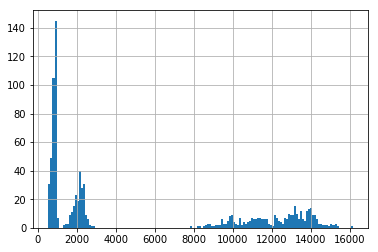

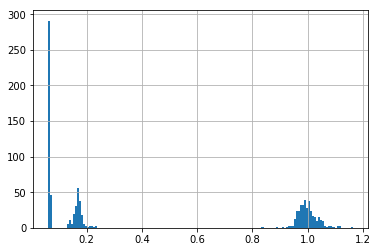

In [9]:
ln_dict = {0: 'dy', 1: 'eu', 2: 'sm'}
color_dict = {'eu': '#EB2326', 'dy': '#4B9944', 'sm': '#FFCE30'}

for i in range(3):
    ch = 'med{}'.format(i)
    d = beads[(beads.ln==ln_dict[i])]
    x = d.x
    y = d.y
    z = d[ch]

    # fit
    def f(x,a,b,c,d,e,f):
        return (a*x[0]**2 + b*x[1]**2 + c*x[0]*x[1] + d*x[0] + e*x[1] + f)
    ps,cov = curve_fit(f,np.array([x,y]),z)
    xopt = fmin(lambda x: -f(x, *ps), np.zeros(2), disp=0)
    fopt = f(xopt, *ps)
    print(ps)
    print('a/b:', round(ps[0]/ps[1], 3))
    print('c:', round(ps[2], 4))
    print('d,e:', round(ps[3], 2), round(ps[4], 2))
    print('f:', round(ps[5], 4))
    print()
    print(xopt)
    
    # plot: fit
    scat = Scatter3d(x=x,y=y,z=z,
                     mode='markers',
                     marker=Marker(size=1.5, color=d.ln.apply(lambda x: color_dict[x])),
                     opacity=.7)
    lsy, lsx = np.mgrid[-440:440:5, -440:440:5]
    surf = Surface(x=lsx,y=lsy,z=f((lsx,lsy), *ps), opacity=.3, colorscale='Greys',
                   contours=go.surface.Contours(
                        z=go.surface.contours.Z(
                          show=False,
                          usecolormap=False,
                          highlightcolor="#42f462",
                          project=dict(z=True))))
    iplot([scat,surf])

    # plot: residual
    scat = Scatter3d(x=x,y=y,z=z - f([x,y], *ps),
                     mode='markers',
                     marker=Marker(size=1.5, color=d.ln.apply(lambda x: color_dict[x])),
                     opacity=.7)
    iplot([scat])


    # correct
    x = beads.x
    y = beads.y
    z = beads[ch]
    
    beads['s{}'.format(ch[-1])] = z/f([x,y], *ps)            # N_corr = I_corr/S_max
    beads['cmed{}'.format(ch[-1])] = fopt * z/f([x,y], *ps)  # I_corr

    z.hist(bins=150)
    plt.show()

    beads['s{}'.format(ch[-1])].hist(bins=150)
    plt.show()

## Bead Sizes (Fig 5E)

well
1    6.8
2    6.0
3    7.0
4    9.0
5    7.5
6    6.5
7    9.0
8    8.4
9    8.3
Name: n_px, dtype: float64


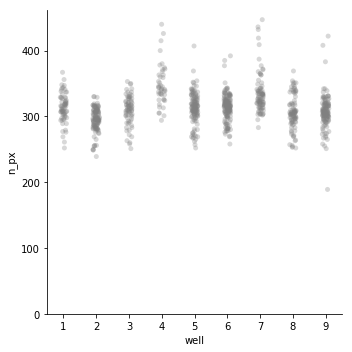

well
1    3.4
2    3.0
3    3.6
4    4.4
5    3.7
6    3.2
7    4.3
8    4.2
9    4.2
Name: r_px, dtype: float64


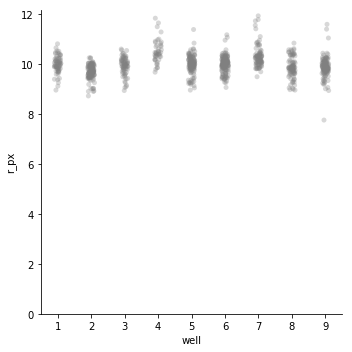

In [10]:
# CV: area
gb = beads.groupby('well').n_px
print((100*gb.std()/gb.mean()).round(1))
sns.catplot(x='well',
            y='n_px',
            data=beads,
            jitter=True,
            alpha=.3,
            color='gray')
plt.ylim(0)
plt.show()

# CV: rad
gb = beads.groupby('well').r_px
print((100*gb.std()/gb.mean()).round(1))
sns.catplot(x='well',
            y='r_px',
            data=beads,
            jitter=True,
            alpha=.3,
            color='gray')
plt.ylim(0)
plt.show()

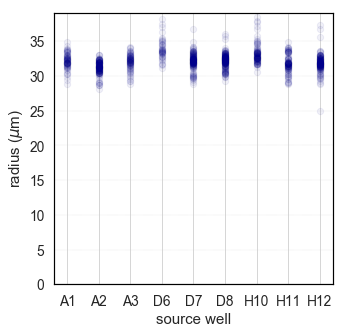

In [11]:
sns.set(style='whitegrid', font='Arial', font_scale=1.25)
well_lst = ['A1', 'A2', 'A3', 'D6', 'D7', 'D8', 'H10', 'H11', 'H12']

scatter_kws = {"alpha": .06, 's': 40}
plt.figure(figsize=(5,5))

sns.regplot('well', beads.r_px*3.222, beads, fit_reg=False, scatter_kws=scatter_kws, color='darkblue')
plt.xlabel('source well')
plt.ylabel('radius ($\mu$m)')
plt.xticks([1,2,3,4,5,6,7,8,9], well_lst)
plt.ylim(0)
plt.gca().yaxis.grid(linestyle='dotted', linewidth=.4)
plt.gca().xaxis.grid(linewidth=.8)

for side in ['top','right','left','bottom']:
    plt.gca().spines[side].set_visible(True)
    plt.gca().spines[side].set_linewidth(1.2)
    plt.gca().spines[side].set_color('black')

plt.savefig('figs/size.pdf'.format(i), bbox_inches='tight')
plt.show()

## Intensity (Fig 5D)

In [14]:
# sns.catplot(x='well',
#             y='med0',
#             data=beads,
#             color='gray', kind='boxen')
# plt.show()

# sns.catplot(x='well',
#             y='s0',
#             data=beads,
#             color='gray', kind='boxen')
# plt.show()

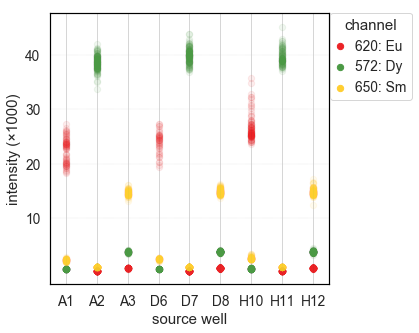

In [12]:
sns.set(style='whitegrid', font='Arial', font_scale=1.25)
well_lst = ['A1', 'A2', 'A3', 'D6', 'D7', 'D8', 'H10', 'H11', 'H12']

scatter_kws = {"alpha": .08, 's': 40}
plt.figure(figsize=(5,5))

sns.regplot('well', 'cmed1', beads, fit_reg=False, scatter_kws=scatter_kws, label='620: Eu', color='#EB2326')
sns.regplot('well', 'cmed0', beads, fit_reg=False, scatter_kws=scatter_kws, label='572: Dy', color='#4B9944')
sns.regplot('well', 'cmed2', beads, fit_reg=False, scatter_kws=scatter_kws, label='650: Sm', color='#FFCE30')
plt.xlabel('source well')
plt.ylabel('intensity (×1000)')
plt.xticks([1,2,3,4,5,6,7,8,9], well_lst)
plt.yticks([1e4,2e4,3e4,4e4], [10,20,30,40])
plt.gca().yaxis.grid(linestyle='dotted', linewidth=.4)
plt.gca().xaxis.grid(linewidth=.8)


for side in ['top','right','left','bottom']:
    plt.gca().spines[side].set_visible(True)
    plt.gca().spines[side].set_linewidth(1.2)
    plt.gca().spines[side].set_color('black')


leg=plt.legend(bbox_to_anchor=(1.005, 1), loc=2, borderaxespad=0, title='channel', handlelength=.6)
for l in leg.legendHandles:
    l.set_alpha(1)


plt.savefig('figs/inten.pdf'.format(i), bbox_inches='tight')
plt.show()

In [13]:
scat = Scatter3d(x=beads.s0,y=beads.s1,z=beads.s2,
                 mode='markers',
                 marker=Marker(size=1.5, color=beads.ln.apply(lambda x: color_dict[x])),
                 opacity=1)
iplot([scat])

# Image Examples (Fig 5C)

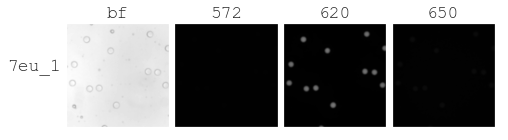

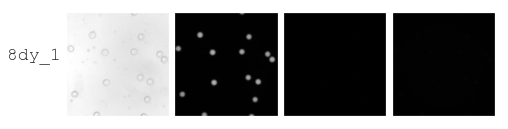

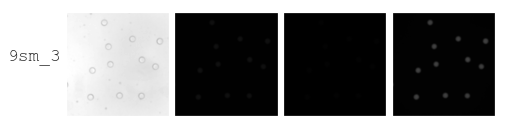

In [14]:
sns.set(font='Courier New', font_scale=1.5)
nm_lst = ['bf','572','620','650']
# acquisition iterator (row)
for i, (name,acq) in enumerate(zip(n_names, img_arr[:,[0,5,6,8],320:-320,320:-320])):
    row_grid = gs.GridSpec(1, c, top=2.5, bottom=0., right=2.5, left=0., hspace=0., wspace=.05)
    
    
    # channel iterator (col)
    for j, (ch, col, nm) in enumerate(zip(acq, row_grid, nm_lst)):
        if name in ['7eu_1', '8dy_1', '9sm_3']:
#             tff.imsave('figs/{}-{}.tif'.format(name,nm),ch, dtype='unint16')
            ax = plt.subplot(col)
            vmax = 2**16-1
            if j==0:
                vmax=None
                ax.set_ylabel(name, labelpad=5, rotation='horizontal', horizontalalignment='right')
            ax.imshow(ch[:,:], cmap='gray',vmin=0, vmax=vmax, interpolation='bicubic')
            ax.set_yticks([])
            ax.set_xticks([])
            if name=='7eu_1':
                plt.title(nm)
    plt.show()